## Machine Learning Project (3EC)
*Traffic at the A1 near Deventer*

Anna Villalobos Peñalver

Akash Hasan

*Report*

At the start of the project we tried out some different ideas for counting the number of vehicles in the pictures. One idea was to detect changes in the pictures. We used an existing tool that detects changes between two images. We also tried to do this manually by generating an image of an empty road and then comparing every pixel of another image to it. For both methods we ended with trying to cluster the differences together to identify and count vehicles, but that proved to not be very accurate, since one cannot find the optimal number of clusters. 

Another thing we tried to use to identify the cars in the pictures was pre-trained models. We tried both the Haar-cascade and KerasCV, which both should be able to identify cars. Nevertheless, none of them managed to do so. We do not know exactly the reasoning behind this. One of the possible reasons we thought about was that the quality of the pictures was not great, and quite some cars had a very similar colour to the colour of the road. 

After our attempts at clustering the differences between images had failed, we opted to go with a neural network. We based this network on what we made in class, but adding an extra layer and more nodes. Even though we cropped the images to limit it to one section of the road, the input was still significantly higher than the 28x28 images we had before. Apart from this we made some other changes as well. We decreased the batch size and the learning rate to limit the input size for each epoch, as we found our network to occasionally overflow. To compensate for this we let the training run for more epochs. Eventually the network reached an accuracy of around 0.85. When testing, the network sometimes gets to the right amount of cars, or is off by 1 to 3 cars. However, when running images through the network with the loaded weights and biases it fails to reproduce that performance.

We also tried to create a neural network with keras. After creating several different models, we always obtained the same result. The first epoch had a training accuracy between 0.085 and 0.095, and then the rest would have a training accuracy of 0.1000. Thus, the model accuracy was around 23%, so we ended up leaving this idea behind.

Also, as opposed to the neural network assignment in class we did not get any labels with the data. We retried counting the cars to make the labels, but eventually we did this manually. That is why our training data is restricted to 4001 images. We made the one hot encoded Y matrix based on these labels.

Having trained the neural network we then used it to quantify traffic density. To do this we made an assumption on how long it took for cars to cross the road section we were looking at. As the images do have timestamps we determined the average time difference between images. With this we made a selection of images from the larger folder that would be most likely to include all vehicles that passed, only once, or closest to that. Running those images through the network and taking a sum of the results gives us a count of all the cars that passed by in that timeframe, from which we determine the density.

Some things to keep in mind when using the network are the following:
The network cannot handle too large quantities of information. In some cases the network overflows, which drops the accuracy close to 0 and gives NaN for the loss. Next to that, the labels of the training images were done manually. In some cases, due to poor visibility of the cars, the labels are wrong. So, even when the network is right in training, it might get the wrong feedback. We think that this is what causes the accuracy to fluctuate this much when training the network.

In [1]:
# importing the required modules
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import os
import csv
import shutil

# to get matplot figures render correctly in the notebook use:
%matplotlib inline 

In [2]:
# defining a function to read the images and store them in a matrix
def process_images(folder_path):
    image_matrices = []
    
    # getting the list of images and sorting them by name
    image_files = sorted(os.listdir(folder_path))
    
    # going through the images
    for filename in image_files:
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # reading the image
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            # converting to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            # creating the matrix
            image_matrices.append(gray_img)
    return image_matrices

In [3]:
# specifying which folder to use
folder_path = 'test_photos'
# gathering all the images and storing them as matrices in an array
images = process_images(folder_path)
image_matrices = np.array(images)
print(image_matrices.shape)

(4001, 150, 1600)


In [4]:
# cropping the images to get the road section we are looking at
cropped_images = image_matrices[:, :, 300:450]
print(cropped_images.shape)

(4001, 150, 150)


In [5]:
# importing the labels
y = pd.read_csv('datasheet1.csv')
y = y.iloc[:, 3]
print(y.shape)

(4002,)


In [6]:
# reshaping each matrix to a single column
reshaped_matrices = cropped_images.reshape(4001, -1)
# transposing the reshaped matrices to get the shape we want
data = reshaped_matrices.T
print(data.shape)

(22500, 4001)


label = 3


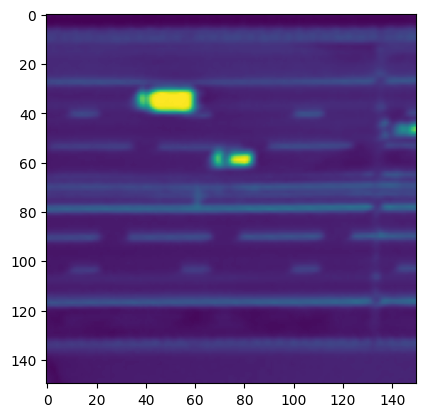

In [7]:
# printing a sample and the corresponding label
sample = data[:, 10]
label = y[1]
plt.imshow(sample.reshape(150,150))  # reshape the sample to a square image of 150 by 150
print(f'label = {label}')

In [8]:
# defining the function for feature scaling
def featurescaling(X):
    std=np.std(X)
    mean=np.mean(X)
    X_sc=np.empty(X.shape)
    for i in range(X.shape[1]):
        X_sc[:,i]=(X[:,i]-mean)/std
    return(X_sc,std,mean)

In [9]:
# rescaling the matrix to values between 0 and 1
data_sc, data_std, data_mean = featurescaling(data)

# creating the one-hot encoded Y matrix
M = y.shape[0]
Y = np.zeros([10,M])

for i in range(M):
    if y[i] == 0:
        Y[0,i] = 1
    elif y[i] == 1:
        Y[1,i] = 1
    elif y[i] == 2:
        Y[2,i] = 1
    elif y[i] == 3:
        Y[3,i] = 1
    elif y[i] == 4:
        Y[4,i] = 1
    elif y[i] == 5:
        Y[5,i] = 1
    elif y[i] == 6:
        Y[6,i] = 1
    elif y[i] == 7:
        Y[7,i] = 1
    elif y[i] == 8:
        Y[8,i] = 1
    elif y[i] == 9:
        Y[9,i] = 1

In [10]:
# splitting the data into the testing, training and validation sets
data_test  = data_sc[:,:280] #7%
data_train = data_sc[:,280:3480] #80%
data_valid = data_sc[:,3480:] #13%

Y_test  = Y[:,:280]
Y_train = Y[:,280:3480]
Y_valid = Y[:,3480:]

In [11]:
# defining some activation functions

def relu(z):

    relu = np.maximum(0, z)
    return relu

def relu_diff(z):

    output=np.where(z>0, 1, 0)
    drelu=output.astype(int)

    return drelu

def softmax(z):
    z -= np.max(z, axis=0)
    exp_z = np.exp(z)
    soft = exp_z / np.sum(exp_z, axis=0)
    
    return soft

def sigmoid(z):
    
    sigmoid = 1 / (1 + np.exp(-z))
    
    return sigmoid

def sigmoid_diff(z):
    
    sigmoid_z = sigmoid(z)  
    dsigmoid = sigmoid_z * (1 - sigmoid_z)
    
    return dsigmoid  

In [12]:
# intialising the neural network
rng = np.random.default_rng()

# number of nodes in each layer
N0 = 22500
N1 = 10000
N2 = 4000
N3 = 200
N4 = 10

# input layer
# no weights and biases

# hidden layer 1 
W1 = np.random.normal(loc=0, scale=np.sqrt(1/(N0)), size=[N1,N0])
b1 = np.zeros((N1, 1))

# hidden layer 2 
W2 = np.random.normal(loc=0, scale=np.sqrt(1/(N0)), size=[N2,N1])
b2 = np.zeros((N2, 1))

# hidden layer 3 
W3 = np.random.normal(loc=0, scale=np.sqrt(1/(N0)), size=[N3,N2])
b3 = np.zeros((N3, 1))

# output layer 
W4 = np.random.normal(loc=0, scale=np.sqrt(1/(N0)), size=[N4,N3])
b4 = np.zeros((N4, 1))

In [13]:
# train settings
learning_rate = 0.0007
no_epochs = 165
batch_size = 90

In [14]:
# computing the accuracy
def compute_accuracy(A2, Y):
    
    accuracy = np.mean(np.argmax(A2, axis=0) == np.argmax(Y, axis=0))
    
    return accuracy

In [15]:
# perform the training

performance_test = []
losses_train = []
losses_valid = []
performance_train = []
performance_valid = []

for epoch in range(1, no_epochs + 1):
    
    combined=np.row_stack([data_train, Y_train])
    
    # for each epoch train over all batches
    for i in range(len(data_train[0])//batch_size):
        start = i * batch_size 
        end = min((i + 1) * batch_size, data_train.shape[1])
        data_batch = data_train[:, start:end]
        Y_batch = Y_train[:, start:end]
        A0 = data_batch
        
        # forward pass
        # computing the output of the network for the batch
        # 1st layer
        Z1 = W1 @ data_batch + b1
        A1 = relu(Z1)
        
        # 2nd layer
        Z2 = W2 @ A1 + b2
        A2 = relu(Z2)
        
        # 3rd layer
        Z3 = W3 @ A2 + b3
        A3 = relu(Z3)
        
        # Output
        Z4 = W4 @ A3 + b4
        A4 = softmax(Z4)

        # backward pass
        # 4th layer
        dZ4 = A4 - Y_batch
        dW4 = dZ4 @ A3.T
        db4 = np.sum(dZ4, axis=1, keepdims=True)/batch_size
        
        # 3rd layer
        var = W4.T@dZ4
        dZ3 = relu_diff(Z3) * var
        dW3 = dZ3 @ A2.T 
        db3 = np.sum(dZ3, axis=1, keepdims=True)/batch_size
        
        # 2nd layer
        var = W3.T@dZ3
        dZ2 = relu_diff(Z2) * var
        dW2 = dZ2 @ A1.T
        db2 = np.sum(dZ2, axis=1, keepdims=True)/batch_size
        
        # 1st layer
        var = W2.T @ dZ2
        dZ1 = relu_diff(Z1) * var
        dW1 = dZ1 @ data_batch.T
        db1= np.sum(dZ1, axis=1, keepdims=True)/batch_size
        
    # gradient descent step / update weights and biases
        W1 -= learning_rate * dW1
        b1 -= learning_rate * db1
        W2 -= learning_rate * dW2
        b2 -= learning_rate * db2
        W3 -= learning_rate * dW3
        b3 -= learning_rate * db3
        W4 -= learning_rate * dW4
        b4 -= learning_rate * db4
    
    #loss for validation
    Z1 = W1 @ data_valid + b1
    A1 = relu(Z1)
    Z2 = W2 @ A1 + b2
    A2 = relu(Z2)
    Z3 = W3 @ A2 + b3
    A3 = relu(Z3)
    Z4 = W4 @ A3 + b4
    A4 = softmax(Z4)
    
    loss =  -(1 / data_valid.shape[1]) * np.sum(Y_valid * np.log(A4))
    losses_valid.append(loss)
    accuracy_valid = compute_accuracy(A4,Y_valid)
    performance_valid.append(accuracy_valid)

    #loss for train 
    Z1 = W1 @ data_train + b1
    A1 = relu(Z1)
    Z2 = W2 @ A1 + b2
    A2 = relu(Z2)
    Z3 = W3 @ A2 + b3
    A3 = relu(Z3)
    Z4 = W4@A3 + b4
    A4 = softmax(Z4)
    loss =  -(1 / data_train.shape[1]) * np.sum(Y_train * np.log(A4))
    losses_train.append(loss)
    
    accuracy_train = compute_accuracy(A4,Y_train)
    performance_train.append(accuracy_train)
    
    print(f"Epoch {epoch}: Train Accuracy = {accuracy_train}, loss = {loss}")


ValueError: operands could not be broadcast together with shapes (10,522) (10,521) 

In [ ]:
# saving the weights in a file
np.savez('network_weights.npz', W1=W1, b1=b1, W2=W2, b2=b2, W3=W3, b3=b3, W4=W4, b4=b4)

Text(0.5, 1.0, 'Loss as function of the epoch')

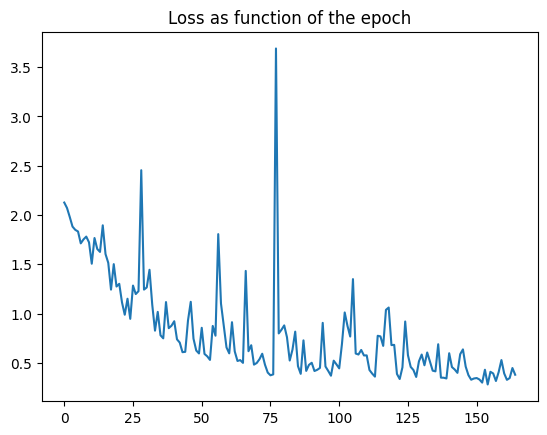

In [ ]:
# plotting the loss and accuracy as function of the epoch number
plt.plot(losses_train)
plt.title("Loss as function of the epoch")

Text(0.5, 1.0, 'Loss validation')

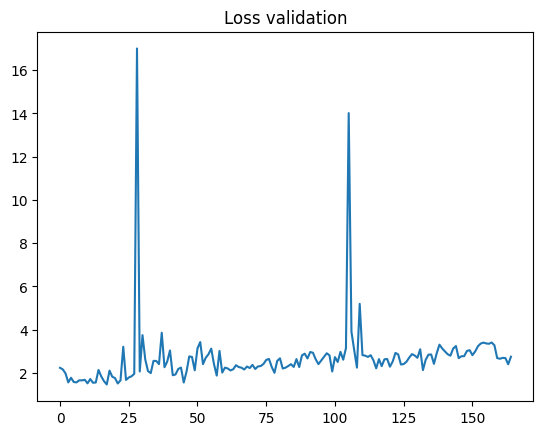

In [ ]:
# plotting the validation loss
plt.plot(losses_valid)
plt.title("Loss validation")

Text(0.5, 1.0, 'Performance validation as function of the epoch')

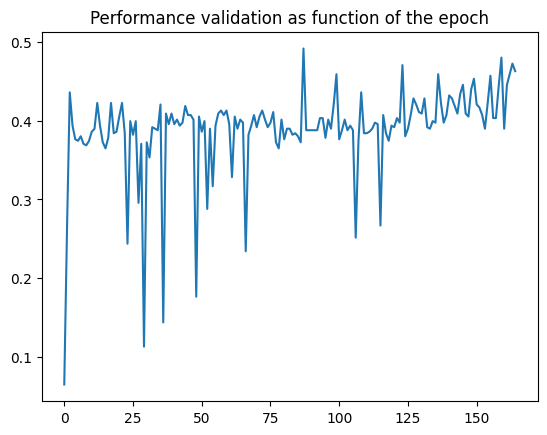

In [ ]:
# plotting the performance validation
plt.plot(performance_valid)
plt.title("Performance validation as function of the epoch")

predicted label = 6
actual label = 3


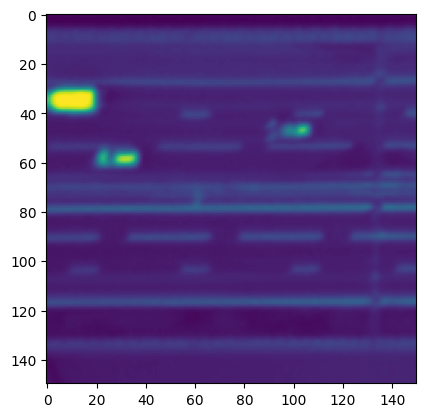

predicted label = 4
actual label = 4


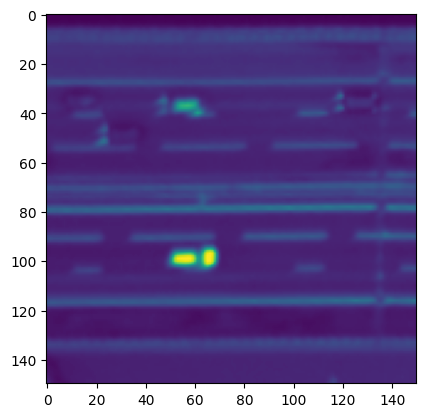

predicted label = 3
actual label = 3


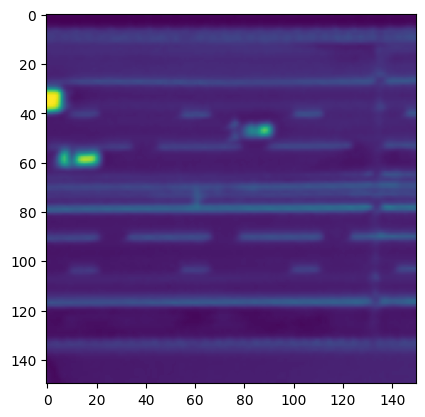

predicted label = 4
actual label = 1


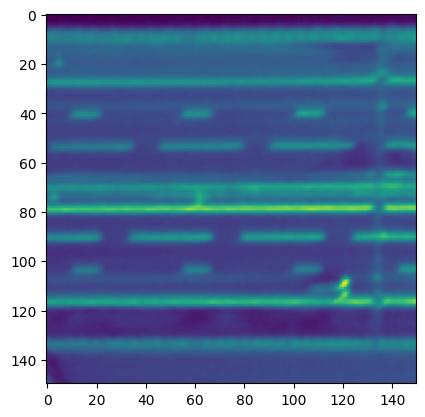

predicted label = 4
actual label = 3


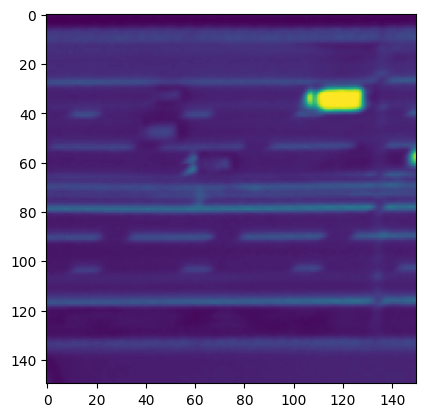

predicted label = 2
actual label = 2


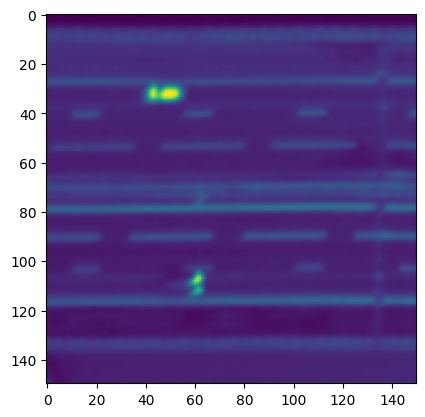

predicted label = 4
actual label = 6


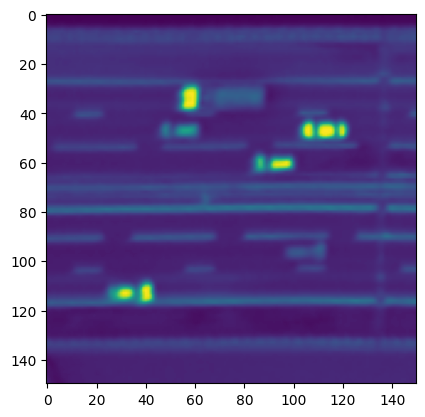

predicted label = 2
actual label = 2


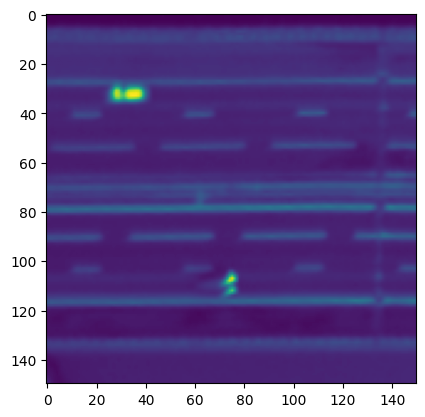

predicted label = 2
actual label = 0


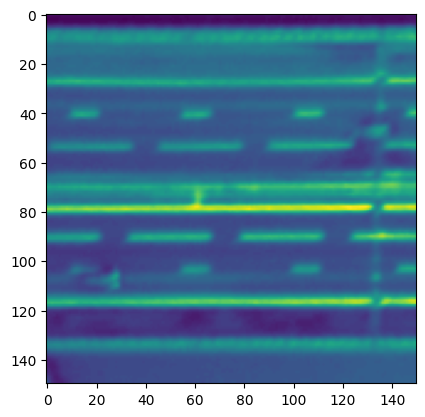

predicted label = 4
actual label = 3


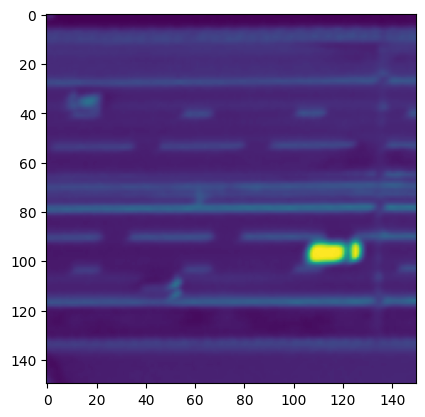

In [ ]:
# checking the prediction of 10 random images
Z1_test =  W1 @ data_test + b1
A1_test = relu(Z1_test)

# 2nd layer
Z2_test = W2 @ A1_test + b2
A2_test = relu(Z2_test)

# 3rd layer
Z3_test = W3 @ A2_test + b3
A3_test = relu(Z3_test)

# 3rd layer
Z4_test = W4 @ A3_test + b4
A4_test = softmax(Z4_test)

import random
random_images_ind = random.sample([i for i in range(data_test.shape[1])], 10)

for ind in random_images_ind:
    sample = data_test[:, ind]
    label = Y_test[:, ind]
    plt.imshow(sample.reshape(150,150))
    print(f'predicted label = {np.argmax(A4_test, axis=0)[ind]}')
    print(f'actual label = {np.argmax(label, axis=0)}')
    plt.show()

In [16]:
# collecting information from the supplementary txt file
# specifying the input and output file paths
input_file = 'info.txt'
output_file = 'outfo.csv'

# reading the text file and write its content to a CSV file
with open(input_file, 'r') as infile, open(output_file, 'w', newline='') as outfile:
    # creating a CSV writer object
    csv_writer = csv.writer(outfile)
    for line in infile:
        # splitting the line into fields (assuming space-separated)
        fields = line.strip().split()
        # writing the fields into the file
        csv_writer.writerow(fields)


FileNotFoundError: [Errno 2] No such file or directory: 'info.txt'

Average duration: 97.4094094094094


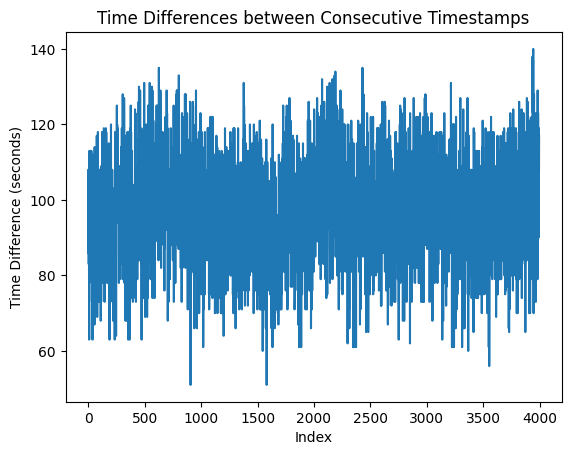

In [ ]:
# collecting the time differences
o = pd.read_csv('outfo.csv')
timestamps = o.iloc[0:4001, 9]
timediffs = []

for i in range(len(timestamps) - 1):
    # converting the timestamps to datetime format
    timestampp = pd.to_datetime(timestamps.iloc[i], format='%H:%M:%S')
    timestampq = pd.to_datetime(timestamps.iloc[i + 1], format='%H:%M:%S')
    
    difference = (timestampq - timestampp).total_seconds()
    
    if difference > 0:
        timediffs.append(difference)
    else:
        pass

# calculating the average time between images
total_duration = sum(timediffs)
average_duration = total_duration / len(timediffs)
print("Average duration:", average_duration)
    
# printing the list of time differences
plt.plot(timediffs)
plt.xlabel('Index')
plt.ylabel('Time Difference (seconds)')
plt.title('Time Differences between Consecutive Timestamps')
plt.show()

In [ ]:
# extracting every 20th image of the folder (assuming that it takes a vehicle 20 frames to cross the road section)
source_folder = 'data fotos'
destination_folder = 'selected fotos'

# sorting the images and selecting every 20th one
files = os.listdir(source_folder)
files.sort()
selected_files = [file for file in files if os.path.isfile(os.path.join(source_folder, file))][::20]

# getting every 20th file and copying it to the new folder
for file in selected_files:
    source_file_path = os.path.join(source_folder, file)
    destination_file_path = os.path.join(destination_folder, file)
    shutil.copy(source_file_path, destination_file_path)


In [126]:
# specifying which folder to use
folder_path = 'selected fotos'
# gathering all the images and storing them as matrices in an array
selectedimages = process_images(folder_path)
selected_image_matrices = np.array(selectedimages)
print(selected_image_matrices.shape)

(201, 150, 1600)


In [127]:
# cropping the images to get the road section we are looking at
cropped_selected_images = selected_image_matrices[:, :, 300:450]
print(cropped_selected_images.shape)

(201, 150, 150)


In [129]:
# reshaping each matrix to a single column
reshaped_selected_matrices = cropped_selected_images.reshape(201, -1)
# transposing the reshaped matrices to get the shape we want
sdata = reshaped_selected_matrices.T
print(sdata.shape)

(22500, 201)


In [135]:
# loading previous weights and biases
wb = np.load('network_weights.npz')

# extracting the arrays from the loaded data
lW1 = wb['W1']
lb1 = wb['b1']
lW2 = wb['W2']
lb2 = wb['b2']
lW3 = wb['W3']
lb3 = wb['b3']
lW4 = wb['W4']
lb4 = wb['b4']

# forward pass
Z1_s = lW1 @ sdata + lb1
A1_s = relu(Z1_s)

Z2_s = lW2 @ A1_s + lb2
A2_s = relu(Z2_s)

Z3_s = lW3 @ A2_s + lb3
A3_s = relu(Z3_s)

Z4_s = lW4 @ A3_s + lb4
A4_s = softmax(Z4_s)


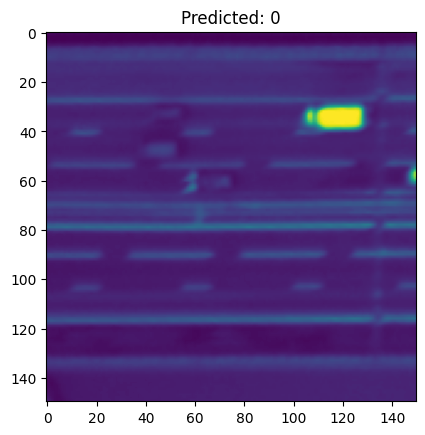

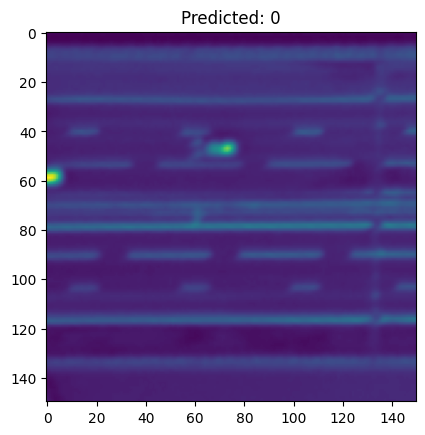

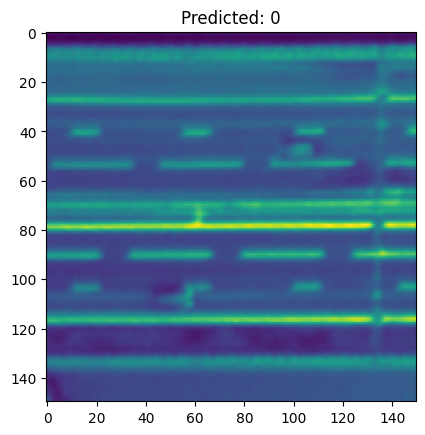

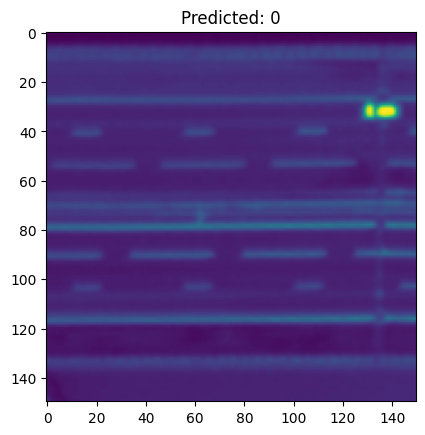

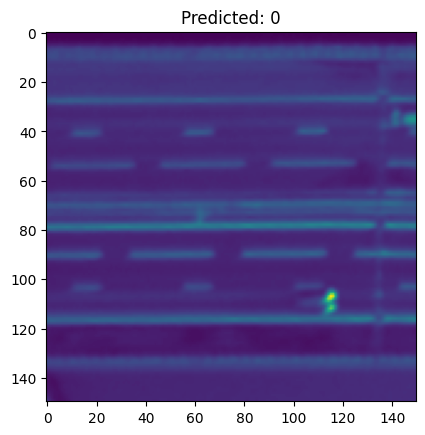

...

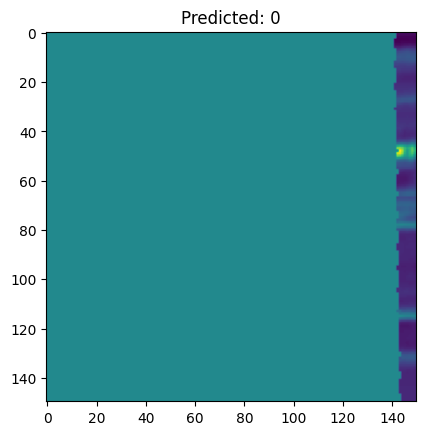

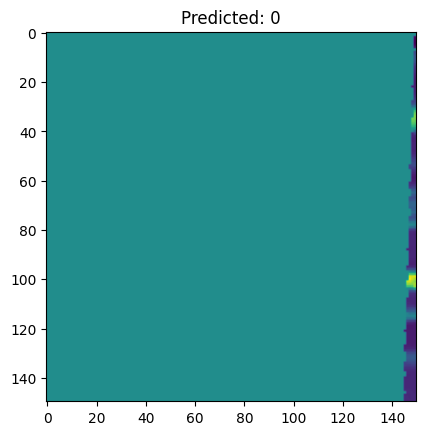

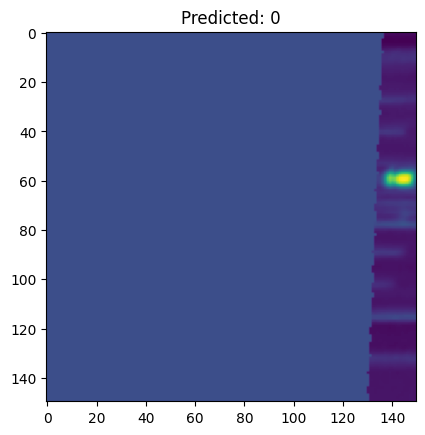

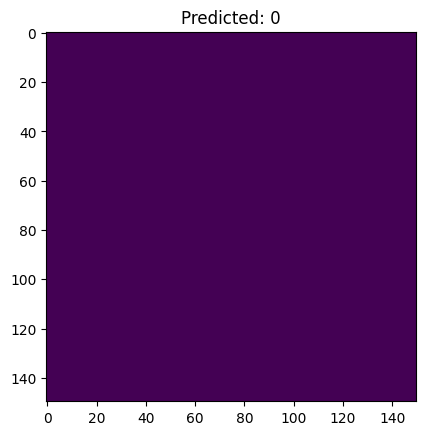

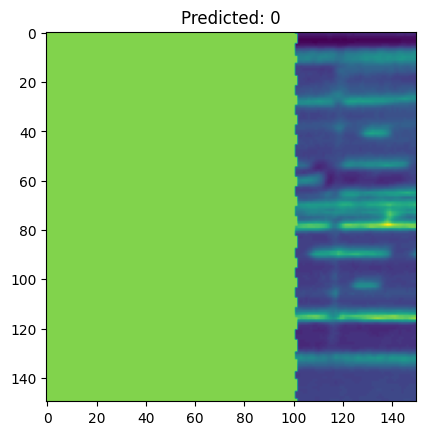

In [163]:
# predicting the amount of cars per photo and adding it all up
count = []

for i in range(len(sdata.T)):
    sample = sdata[:, i]
    prediction = np.argmax(A4_s[:, i])
    count.append(prediction)
    plt.imshow(sample.reshape(150, 150))  # Assuming each image is of size 150x150
    plt.title(f"Predicted: {prediction}")
    plt.show()

In [184]:
# dividing the count by the number of hours
print(sum(count)/1006)

0.4363817097415507
